## Calculate and plot results for centrality estimation
requires simulation results from `pop_gen_run_pedsim.ipynb`

In [1]:
import numpy as np
import os as os
import sys as sys
import multiprocessing as mp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py as h5py
from scipy import interpolate
from scipy import stats
import logging
from itertools import product
from matplotlib.backends.backend_pdf import PdfPages
import datetime

# Disable matplotlib warnings
logger = logging.getLogger('matplotlib')
logger.setLevel(logging.ERROR)

# Set correct font type for image saving
from matplotlib import rcParams  
rcParams['font.family'] = 'sans-serif'  
rcParams['font.sans-serif'] = ['Arial'] 
rcParams['font.size'] = 15
rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42

# Show the current working directory
print(os.getcwd()) 
os.chdir('./ped-sim')

print(f"CPU Count: {mp.cpu_count()}")
total_memory = os.sysconf('SC_PAGE_SIZE') * os.sysconf('SC_PHYS_PAGES')
print(f"Total Physical Memory: {total_memory/(10**9):.2f} GB")

/home/marcus/Project/BLG_analysis/kinship_structure
CPU Count: 12
Total Physical Memory: 18.86 GB


### Function for testing centrality
See paper SI for details.

The mean centrality of simulated populations with the top 10% mean similarities, $\bar{C}_{top10\%}$, is compared to that of simulated populations with the median 10% mean similarities, $\bar{C}_{med10\%}$. A high value of $\bar{C}_{top10\%}$ that significantly exceeds $\bar{C}_{med10\%}$ suggests a high centrality C of the target population, namely with a dominant single lineage. 

In [2]:
from post_process_for_simulation import get_flat_similarities

def test_centrality(flat_matrices, flat_centrality, ref_matrix, return_tree = False, flat_tree = None, return_all = False):
    flat_similarity = get_flat_similarities(flat_matrices, ref_matrix)
    flat_similarity = np.squeeze(np.mean(flat_similarity, axis = 0))
    
    percentile_45 = np.percentile(flat_similarity, 45)
    percentile_55 = np.percentile(flat_similarity, 55)
    percentile_90 = np.percentile(flat_similarity, 90)

    centrality_top10 = flat_centrality[np.where(flat_similarity>percentile_90)]
    centrality_med10 = flat_centrality[np.where((flat_similarity<=percentile_55)&(flat_similarity>percentile_45))]
    
    similarity_top10 = flat_similarity[np.where(flat_similarity>percentile_90)]
    similarity_med10 = flat_similarity[np.where((flat_similarity<=percentile_55)&(flat_similarity>percentile_45))]

    plot_df = [centrality_top10,centrality_med10,flat_centrality]
    
    if return_tree & (flat_tree is not None):
        tree_top10 = flat_tree[np.where(flat_similarity>percentile_90)]
        tree_med10 = flat_tree[np.where((flat_similarity<=percentile_55)&(flat_similarity>percentile_45))]
        if return_all:
            return plot_df, flat_similarity, tree_top10, tree_med10, similarity_top10, similarity_med10
        return plot_df, flat_similarity, tree_top10, tree_med10
    else:
        return plot_df, flat_similarity

## Apply to BLG data and plot results

### Read real data

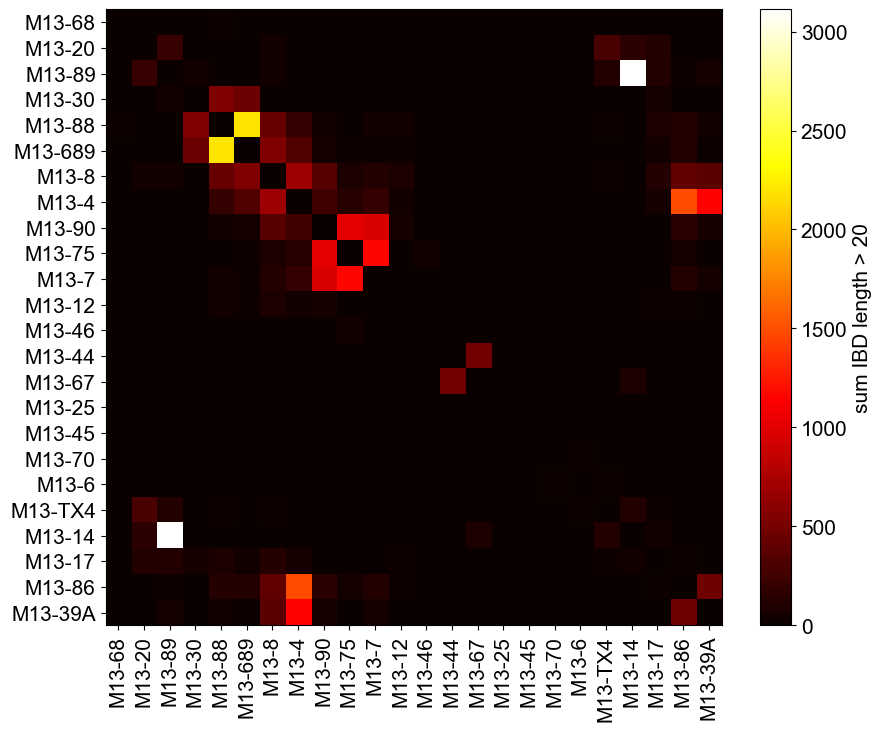

In [3]:
from seg_process import generate_matrix, matrix_simmilarity

np.random.seed(12)
BLG_df = pd.read_csv('../All_ibd_ind.d220.filtered0.15x.csv')
BLG_df = BLG_df[BLG_df['iid1'].str.startswith('BLG_M13') & BLG_df['iid2'].str.startswith('BLG_M13')]
BLG_df['iid1']=BLG_df['iid1'].apply(lambda x:x[4:])
BLG_df['iid2']=BLG_df['iid2'].apply(lambda x:x[4:])

BLG_sex_df = pd.read_csv('../Baligang1.csv',usecols=['Sample','sex','MT haplotype'])
BLG_sex_df.columns = ['iid', 'sex', 'mt']
BLG_sex_df['iid']=BLG_sex_df['iid'].apply(lambda x:x[4:])

BLG_matrix_cl = generate_matrix(BLG_df, BLG_sex_df, order = 'level', keep_sex = True, plot = True, clustering=True)

### degree distribution plot

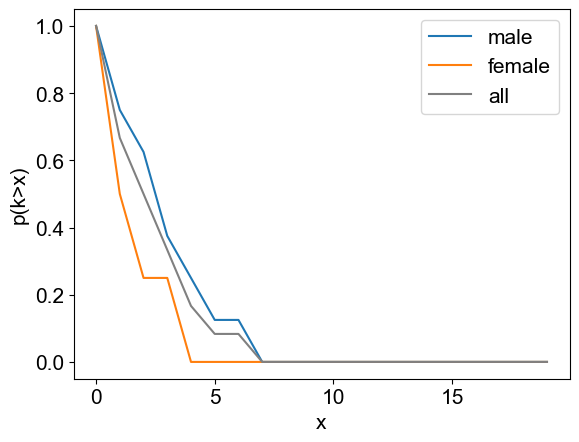

In [4]:
degree_dist_male = np.zeros((16,))
degree_dist_female = np.zeros((8,))

for i in range(16):
    degree_dist_male[i] = np.sum(BLG_matrix_cl[i,:]>200)
    
for i in range(8):
    degree_dist_female[i] = np.sum(BLG_matrix_cl[16+i,:]>200)
    
degree_cum_male = np.zeros((20,))
degree_cum_female = np.zeros((20,))
degree_cum_all = np.zeros((20,))

for i, cutoff in enumerate(range(0,20)):
    degree_cum_male[i] = np.sum(degree_dist_male>=cutoff)/16
    degree_cum_female[i] = np.sum(degree_dist_female>=cutoff)/8
    degree_cum_all[i] = (np.sum(degree_dist_male>=cutoff)+np.sum(degree_dist_female>=cutoff))/24

plt.figure()
plt.plot(degree_cum_male)
plt.plot(degree_cum_female)
plt.plot(degree_cum_all, color='gray')
plt.xlabel('x')
plt.ylabel('p(k>x)')
plt.legend(['male','female','all'])
plt.show()

### Calculate matrix similarities and save data

In [4]:
np.random.seed(12) # for reproducibility
os.makedirs("../plots", exist_ok=True)

flat_matrices = np.load('../result_npys/use_small_data/flat_matrices.npy')
flat_tree = np.load('../result_npys/use_small_data/flat_tree.npy')
flat_centrality = np.load('../result_npys/use_small_data/flat_centrality.npy')

plot_df, flat_similarity, tree_top10, tree_med10, similarity_top10, similarity_med10 = test_centrality(flat_matrices, flat_centrality, BLG_matrix_cl, return_tree = True, flat_tree = flat_tree, return_all=True)

centrality_top10, centrality_med10, _ = plot_df

# get information about simulated populations with top and median similarities. Not visualized in this final version for simplicity.
random_indices = np.random.choice(np.arange(tree_top10.shape[0]), size=16, replace=False) # 16 samples
random_top10_tree_list = tree_top10[random_indices]
random_top10_centrality_list = centrality_top10[random_indices]

random_indices = np.random.choice(np.arange(tree_med10.shape[0]), size=16, replace=False) # 16 samples
random_med10_tree_list = tree_med10[random_indices]
random_med10_centrality_list = centrality_med10[random_indices]

sorted_tree_list = flat_tree[np.argsort(-flat_similarity)] # real top16
sorted_centrality_list = flat_centrality[np.argsort(-flat_similarity)]
real_top16_tree_list = sorted_tree_list[:16]
real_top16_centrality_list = sorted_centrality_list[:16]

with open('../plots/Fig_4F_data.txt','w') as datfile:
    datfile.write('All simulated populations\t\t Populations with Top 10% mean similarity\t\t Populations with Median 10% mean similarity\n')
    datfile.write('Population id\tCentrality\tMean similarity\tCentrality\tMean similarity\tCentrality\tMean similarity\n')
    for i in range(len(flat_similarity)):
        datfile.write(f'{i+1}\t')
        datfile.write(f'{flat_centrality[i]}\t')
        datfile.write(f'{flat_similarity[i]}\t')
        if i < len(plot_df[0]):
            datfile.write(f'{plot_df[0][i]}\t')
            datfile.write(f'{similarity_top10[i]}\t')
        if i < len(plot_df[1]):
            datfile.write(f'{plot_df[1][i]}\t')
            datfile.write(f'{similarity_med10[i]}\t')
        datfile.write('\n')

similarity: 0/10181 done
similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 3000/10181 done
similarity: 4000/10181 done
similarity: 5000/10181 done
similarity: 6000/10181 done
similarity: 7000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 10000/10181 done


### Plot results

/home/marcus/Project/BLG_analysis/kinship_structure/post_processing_plot.py:127: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(xticks[:-1])
/home/marcus/Project/BLG_analysis/kinship_structure/post_processing_plot.py:128: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels([xticks[-1]])


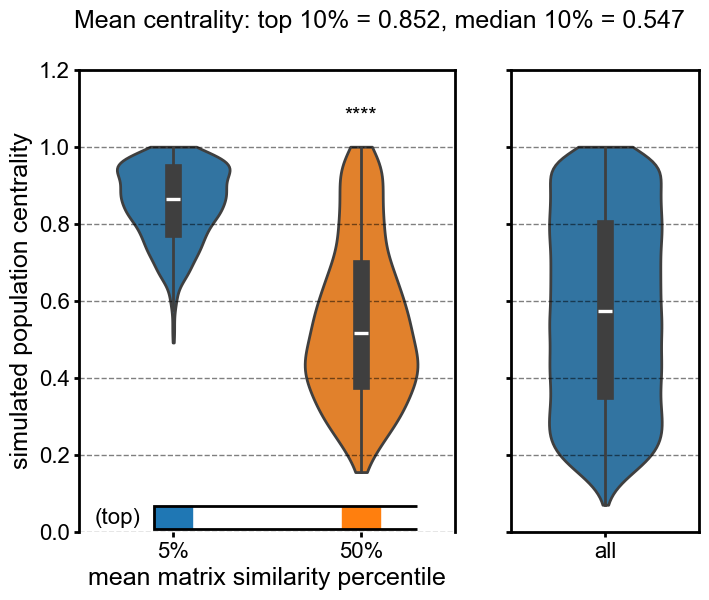

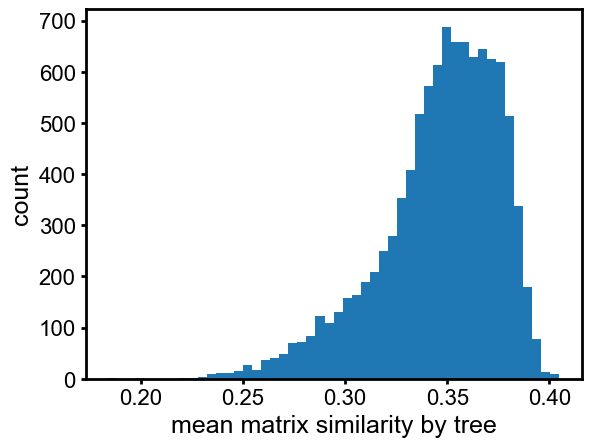

In [5]:
from post_processing_plot import plot_results_sep_new
from post_processing_plot import plot_results, get_pvals, plot_heatmap, plot_bar3d, summarize_trees

timestamp = datetime.datetime.now().strftime("%Y_%m_%d_%H_%M_%S")
pdf = PdfPages(f'../plots/BLG_refined_plots_(use_all)_centrality_{timestamp}.pdf')

rcParams.update(plt.rcParamsDefault)
rcParams['font.family'] = 'sans-serif' 
rcParams['font.sans-serif'] = ['Arial']  
rcParams['font.size'] = 15

rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42


fig = plot_results_sep_new(plot_df, ['5%','50%','all'], 'mean matrix similarity percentile', 'simulated population centrality', figtype = 'violin', ylim = (0,1.2), ttest = True,
                        title = "Mean centrality: top 10% = {:.3f}, median 10% = {:.3f}".format(np.mean(centrality_top10), np.mean(centrality_med10)))

fig_sim = plt.figure()
plt.hist(flat_similarity,50)
plt.xlabel('mean matrix similarity by tree')
plt.ylabel('count')
plt.show()


all_figs = [fig,fig_sim]

for fign in all_figs:
    pdf.savefig(fign, bbox_inches='tight')
    
pdf.close()

## Validate on the test dataset (artificial)

### Load datasets

In [6]:
flat_matrices_test = np.load('../result_npys/use_small_data/flat_matrices_test_150_400_2.npy')
flat_tree_test = np.load('../result_npys/use_small_data/flat_tree_test_150_400_2.npy')
flat_centrality_test = np.load('../result_npys/use_small_data/flat_centrality_test_150_400_2.npy')

flat_matrices = np.load('../result_npys/use_small_data/flat_matrices.npy')
flat_tree = np.load('../result_npys/use_small_data/flat_tree.npy')
flat_centrality = np.load('../result_npys/use_small_data/flat_centrality.npy')

### calculate matrix similarities (slow)

In [15]:
# centrality ranges for validation
test_cents = [(0.95,0.99)]+list(zip(np.round(np.linspace(0.9,0.25,14)*100)/100,np.round(np.linspace(0.95,0.3,14)*100)/100))+[(0,0.25)]

samp_num = 280
samps = 5

def validation_artificial(interval):
    np.random.seed(12) # for reproducibility
    
    mask = (flat_centrality_test > interval[0]) & (flat_centrality_test <= interval[1])
    flat_matrices_use = np.squeeze(flat_matrices_test[:,:,:,np.where(mask)])
    
    selected_columns = np.random.choice(flat_matrices_use.shape[3], size=samp_num, replace=False)
    flat_matrices_use = flat_matrices_use[:,:,:,selected_columns]
    
    samps = flat_matrices_use.shape[2]
    test_data_final = np.zeros((samp_num*samps,3))
    
    for j in range(samp_num):
        for samp in range(samps):
            ref_matrix = flat_matrices_use[:,:,samp,j]
            plot_df, _ = test_centrality(flat_matrices, flat_centrality, ref_matrix, return_tree = False, flat_tree = None)

            centrality_top10, centrality_med10, _ = plot_df
            _,ttest_p = stats.ttest_ind(centrality_top10, centrality_med10)
            t_data = (np.mean(centrality_top10),np.mean(centrality_med10),ttest_p)

            test_data_final[j*samps+samp,:] = t_data
    
    return test_data_final


test_data = np.zeros((samp_num*samps,len(test_cents),3))
with mp.Pool(processes=16) as pool:
    iter = pool.imap(validation_artificial, test_cents)
    i = 0
    for test_data_temp in iter:
        test_data[:,i,:] = test_data_temp
        i += 1
    np.save('../result_npys/test_data_rebuilt_0403_150_400_2',test_data)

similarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 done


similarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 done
similarity: 0/10181 donesimilarity: 0/10181 done
similarity: 0/10181 done
similarity: 0/10181 donesimilarity: 0/10181 done









similarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 donesimilarity: 1000/10181 done








similarity: 1000/10181 donesimilarity: 1000/10181 done
similarity: 1000/10181 done

similarity: 1000/10181 done
similarity: 1000/10181 donesimilarity: 1000/10181 done


similarity: 2000/10181 donesimilarity: 2000/10181 donesimilarity: 2000/10181 donesimilarity: 2000/10181 done


similarity: 2000/10181 donesimilarity: 20

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 7000/10181 done
similarity: 8000/10181 done
similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 8000/10181 done
similarity: 7000/10181 done
similarity: 5000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 done
similarity: 6000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 2000/10181 done
similarity: 9000/10181 done
similarity: 9000/10181 donesimilarity: 8000/10181 done

similarity: 1000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 done
similarity: 10000/10181 done
similarity: 9000/10181 done
similarity: 7000/10181 done
similarity: 10000/10181 done
similarity: 7000/10181 done
similarity: 0/10181 donesimilarity: 3000/10181 done

similarity: 9000/10181 done
similarity: 10000/10181 done
similarity: 0/10181 donesimilarity: 2000/10181 done

similarity: 9000/10181 done
similarity: 10000/10181

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



similarity: 0/10181 donesimilarity: 4000/10181 done

similarity: 6000/10181 done
similarity: 6000/10181 done
similarity: 7000/10181 done
similarity: 8000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 7000/10181 done
similarity: 7000/10181 done
similarity: 7000/10181 donesimilarity: 1000/10181 donesimilarity: 5000/10181 done


similarity: 9000/10181 done
similarity: 9000/10181 donesimilarity: 10000/10181 done

similarity: 10000/10181 done
similarity: 2000/10181 done
similarity: 8000/10181 done
similarity: 0/10181 done
similarity: 7000/10181 done
similarity: 9000/10181 done
similarity: 0/10181 done
similarity: 9000/10181 done
similarity: 10000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 done
similarity: 0/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 donesimilarity: 8000/10181 done

similarity: 10000/10181 done
similarity: 9000/10181 donesimilarity: 2000/10181 donesimilarity: 10000/10181 done


/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 3000/10181 done
similarity: 7000/10181 done
similarity: 10000/10181 done
similarity: 3000/10181 done
similarity: 1000/10181 donesimilarity: 9000/10181 done

similarity: 5000/10181 done
similarity: 0/10181 donesimilarity: 5000/10181 done
similarity: 10000/10181 done

similarity: 4000/10181 done
similarity: 3000/10181 done
similarity: 8000/10181 done
similarity: 7000/10181 done
similarity: 0/10181 done
similarity: 8000/10181 done
similarity: 4000/10181 done
similarity: 4000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 8000/10181 done
similarity: 4000/10181 done
similarity: 10000/10181 donesimilarity: 6000/10181 donesimilarity: 4000/10181 done


similarity: 2000/10181 done
similarity: 1000/10181 done
similarity: 5000/10181 done
similarity: 1000/10181 donesimilarity: 0/10181 done

similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 5000/10181 done
similarity: 5000/10181 done
similarity: 7000/10181 don

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


similarity: 0/10181 done
similarity: 5000/10181 done
similarity: 4000/10181 done
similarity: 9000/10181 done
similarity: 1000/10181 done
similarity: 4000/10181 done
similarity: 4000/10181 done
similarity: 8000/10181 done
similarity: 8000/10181 done
similarity: 4000/10181 donesimilarity: 6000/10181 done

similarity: 5000/10181 done
similarity: 1000/10181 done
similarity: 1000/10181 done
similarity: 9000/10181 done
similarity: 7000/10181 done
similarity: 5000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 5000/10181 done
similarity: 5000/10181 donesimilarity: 2000/10181 done

similarity: 10000/10181 done
similarity: 9000/10181 donesimilarity: 9000/10181 done

similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 0/10181 done
similarity: 6000/10181 done
similarity: 2000/10181 done
similarity: 2000/10181 donesimilarity: 10000/10181 done

similarity: 8000/10181 done
similarity: 3000/10181 donesimilarity: 6000/10181 done
similarity: 7000/10181 do

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 8000/10181 done
similarity: 1000/10181 donesimilarity: 1000/10181 done

similarity: 7000/10181 done
similarity: 1000/10181 done
similarity: 10000/10181 donesimilarity: 8000/10181 done

similarity: 3000/10181 done
similarity: 0/10181 donesimilarity: 1000/10181 done
similarity: 1000/10181 done

similarity: 3000/10181 done
similarity: 2000/10181 done
similarity: 7000/10181 done
similarity: 9000/10181 done
similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 8000/10181 done
similarity: 2000/10181 done
similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 9000/10181 done
similarity: 9000/10181 done
similarity: 2000/10181 done
similarity: 1000/10181 done
similarity: 4000/10181 done
similarity: 2000/10181 done
similarity: 8000/10181 done
similarity: 3000/10181 done
similarity: 3000/10181 done
similarity: 4000/10181 done
similarity: 9000/10181 done
similarity: 10000/10181 done
similarity: 2000/10181 donesimilarity: 0/10181 done

similarity: 2000/10181 d

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


similarity: 0/10181 donesimilarity: 9000/10181 done
similarity: 3000/10181 done

similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 3000/10181 done
similarity: 2000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 8000/10181 done
similarity: 3000/10181 done
similarity: 2000/10181 donesimilarity: 2000/10181 done

similarity: 1000/10181 done
similarity: 8000/10181 donesimilarity: 4000/10181 done

similarity: 2000/10181 done
similarity: 10000/10181 done
similarity: 3000/10181 done
similarity: 1000/10181 donesimilarity: 2000/10181 done
similarity: 3000/10181 done

similarity: 0/10181 done
similarity: 9000/10181 done
similarity: 4000/10181 done
similarity: 10000/10181 done
similarity: 9000/10181 done
similarity: 4000/10181 done
similarity: 3000/10181 done
similarity: 0/10181 done
similarity: 3000/10181 done
similarity: 2000/10181 donesimilarity: 3000/10181 done

similarity: 9000/10181 done
similarity: 2000/10181 done
similarity: 5000/10181 done

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 8000/10181 done
similarity: 5000/10181 done
similarity: 5000/10181 done
similarity: 5000/10181 done
similarity: 4000/10181 done
similarity: 8000/10181 done
similarity: 5000/10181 done
similarity: 10000/10181 done
similarity: 8000/10181 donesimilarity: 9000/10181 done

similarity: 6000/10181 done
similarity: 0/10181 done
similarity: 9000/10181 done
similarity: 1000/10181 donesimilarity: 2000/10181 done
similarity: 4000/10181 done

similarity: 4000/10181 done
similarity: 7000/10181 done
similarity: 6000/10181 done
similarity: 6000/10181 done
similarity: 6000/10181 done
similarity: 5000/10181 done
similarity: 9000/10181 done
similarity: 6000/10181 done
similarity: 10000/10181 donesimilarity: 10000/10181 done

similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 1000/10181 donesimilarity: 2000/10181 done

similarity: 9000/10181 done
similarity: 0/10181 donesimilarity: 3000/10181 done

similarity: 7000/10181 done
similarity: 0/10181 done
similarity: 8000/10181 don

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


similarity: 0/10181 done
similarity: 5000/10181 done
similarity: 9000/10181 done
similarity: 3000/10181 donesimilarity: 1000/10181 done

similarity: 5000/10181 done
similarity: 9000/10181 done
similarity: 10000/10181 done
similarity: 5000/10181 done
similarity: 4000/10181 done
similarity: 6000/10181 done
similarity: 0/10181 donesimilarity: 6000/10181 done

similarity: 4000/10181 donesimilarity: 7000/10181 done

similarity: 8000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 8000/10181 done
similarity: 4000/10181 donesimilarity: 10000/10181 done

similarity: 10000/10181 done
similarity: 6000/10181 done
similarity: 2000/10181 donesimilarity: 0/10181 done

similarity: 0/10181 done
similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 6000/10181 done
similarity: 5000/10181 done
similarity: 8000/10181 done
similarity: 1000/10181 done
similarity: 7000/10181 done
similarity: 2000/10181 donesimilarity: 9000/10181 done

similarity: 7000/10181 done
s

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 5000/10181 done
similarity: 7000/10181 donesimilarity: 10000/10181 done

similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 1000/10181 done
similarity: 0/10181 done
similarity: 4000/10181 done
similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 3000/10181 done
similarity: 8000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 1000/10181 donesimilarity: 5000/10181 done

similarity: 6000/10181 done
similarity: 3000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 done
similarity: 1000/10181 done
similarity: 8000/10181 done
similarity: 2000/10181 done
similarity: 5000/10181 done
similarity: 4000/10181 donesimilarity: 9000/10181 done

similarity: 3000/10181 donesimilarity: 2000/10181 done

similarity: 6000/10181 done
similarity: 9000/10181 done
similarity: 7000/10181 done
similarity: 2000/10181 done
similarity: 10000/10181 done
similarity: 4000/10181 done
similarity: 7000/10181 done
similarity: 0/10181 d

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


similarity: 7000/10181 done

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



similarity: 0/10181 done
similarity: 0/10181 done
similarity: 7000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 3000/10181 done
similarity: 5000/10181 done
similarity: 3000/10181 done
similarity: 2000/10181 done
similarity: 9000/10181 done
similarity: 5000/10181 donesimilarity: 1000/10181 done
similarity: 4000/10181 done

similarity: 1000/10181 done
similarity: 1000/10181 done
similarity: 8000/10181 done
similarity: 8000/10181 done
similarity: 2000/10181 done
similarity: 9000/10181 done
similarity: 7000/10181 done
similarity: 10000/10181 donesimilarity: 2000/10181 done

similarity: 4000/10181 donesimilarity: 6000/10181 done

similarity: 4000/10181 done
similarity: 6000/10181 done
similarity: 3000/10181 done
similarity: 0/10181 done
similarity: 5000/10181 done
similarity: 2000/10181 done
similarity: 10000/10181 done
similarity: 2000/10181 donesimilarity: 9000/10181 done

similarity: 9000/10181 don

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 5000/10181 done
similarity: 4000/10181 done
similarity: 7000/10181 done
similarity: 8000/10181 done
similarity: 7000/10181 done
similarity: 1000/10181 donesimilarity: 9000/10181 done

similarity: 1000/10181 done
similarity: 2000/10181 done
similarity: 6000/10181 done
similarity: 1000/10181 done
similarity: 9000/10181 done
similarity: 8000/10181 done
similarity: 1000/10181 done
similarity: 5000/10181 done
similarity: 9000/10181 done
similarity: 3000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 8000/10181 done
similarity: 2000/10181 done
similarity: 10000/10181 donesimilarity: 2000/10181 done

similarity: 3000/10181 donesimilarity: 7000/10181 donesimilarity: 8000/10181 done


similarity: 2000/10181 done
similarity: 10000/10181 donesimilarity: 0/10181 done

similarity: 9000/10181 done
similarity: 0/10181 done
similarity: 6000/10181 done
similarity: 2000/10181 done
similarity: 4000/10181 done
similarity: 10000/10181 done
similarity: 2000/10181 

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


similarity: 0/10181 done
similarity: 1000/10181 done
similarity: 5000/10181 done
similarity: 6000/10181 done
similarity: 7000/10181 donesimilarity: 1000/10181 done

similarity: 2000/10181 done
similarity: 5000/10181 done
similarity: 2000/10181 done
similarity: 3000/10181 done
similarity: 9000/10181 donesimilarity: 7000/10181 done

similarity: 8000/10181 done
similarity: 1000/10181 donesimilarity: 9000/10181 done

similarity: 2000/10181 donesimilarity: 10000/10181 done

similarity: 2000/10181 done
similarity: 0/10181 done
similarity: 2000/10181 done
similarity: 6000/10181 done
similarity: 7000/10181 done
similarity: 3000/10181 done
similarity: 3000/10181 done
similarity: 8000/10181 done
similarity: 4000/10181 done
similarity: 6000/10181 done
similarity: 8000/10181 done
similarity: 10000/10181 donesimilarity: 9000/10181 done

similarity: 10000/10181 donesimilarity: 3000/10181 done

similarity: 0/10181 done
similarity: 3000/10181 done
similarity: 1000/10181 done
similarity: 3000/10181 don

/home/marcus/Project/BLG_analysis/kinship_structure/seg_process.py:289: RuntimeWarning: invalid value encountered in scalar divide
  sim = 1-(dist/denom)


similarity: 6000/10181 done
similarity: 1000/10181 donesimilarity: 3000/10181 done

similarity: 8000/10181 done
similarity: 3000/10181 donesimilarity: 9000/10181 donesimilarity: 6000/10181 done


similarity: 3000/10181 done
similarity: 6000/10181 donesimilarity: 5000/10181 done

similarity: 3000/10181 done
similarity: 9000/10181 done
similarity: 6000/10181 donesimilarity: 1000/10181 done

similarity: 4000/10181 done
similarity: 1000/10181 done
similarity: 7000/10181 done
similarity: 4000/10181 done
similarity: 9000/10181 done
similarity: 7000/10181 done
similarity: 2000/10181 done
similarity: 4000/10181 done
similarity: 7000/10181 done
similarity: 10000/10181 done
similarity: 4000/10181 done
similarity: 0/10181 done
similarity: 6000/10181 done
similarity: 4000/10181 done
similarity: 10000/10181 done
similarity: 2000/10181 done
similarity: 8000/10181 donesimilarity: 7000/10181 done
similarity: 5000/10181 done

similarity: 2000/10181 done
similarity: 0/10181 done
similarity: 5000/10181 d

/home/marcus/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


/home/marcus/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


similarity: 0/10181 done
similarity: 3000/10181 done
similarity: 10000/10181 done
similarity: 10000/10181 done
similarity: 8000/10181 done
similarity: 3000/10181 done
similarity: 7000/10181 donesimilarity: 0/10181 donesimilarity: 0/10181 done


similarity: 3000/10181 done
similarity: 7000/10181 done
similarity: 4000/10181 done
similarity: 3000/10181 done
similarity: 8000/10181 done
similarity: 6000/10181 donesimilarity: 4000/10181 done

similarity: 6000/10181 done
similarity: 4000/10181 done
similarity: 1000/10181 done
similarity: 6000/10181 done
similarity: 4000/10181 done
similarity: 8000/10181 done
similarity: 1000/10181 done
similarity: 1000/10181 done
similarity: 9000/10181 done
similarity: 4000/10181 done
similarity: 7000/10181 done
similarity: 5000/10181 done
similarity: 5000/10181 done
similarity: 8000/10181 done
similarity: 9000/10181 done
similarity: 4000/10181 done
similarity: 2000/10181 done
similarity: 5000/10181 done
similarity: 7000/10181 done
similarity: 7000/10181 done

### Plot results for artificial validation

In [17]:
test_data = np.load('../result_npys/test_data_rebuilt_0403_150_400_2.npy')
test_data.shape

(1400, 16, 3)

/tmp/ipykernel_199917/3200200189.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(positives, linewidth = 2, edgecolor='black',width = 0.7, palette=colors)
/tmp/ipykernel_199917/3200200189.py:39: UserWarning: The palette list has more values (104) than needed (16), which may not be intended.
  sns.barplot(positives, linewidth = 2, edgecolor='black',width = 0.7, palette=colors)


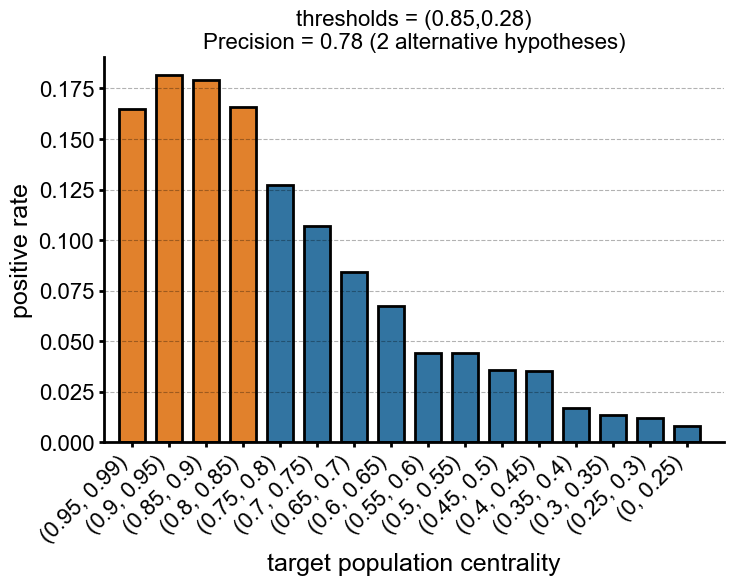

In [18]:
test_cents = [(0.95,0.99)]+list(zip(np.round(np.linspace(0.9,0.25,14)*100)/100,np.round(np.linspace(0.95,0.3,14)*100)/100))+[(0,0.25)]

pos_thress = [0.8,0.75,0.7]
diff_thress = [0.2,0.175,0.15]
pval_thres = 0.0001

pos_thress = [0.85]
diff_thress = [0.28]

reps = 1400

timestamp = datetime.datetime.now().strftime("%Y_%m_%d_%H_%M_%S")

int_strs = [f'{inte}' for inte in test_cents]

for pos_thres,diff_thres in product(pos_thress,diff_thress):
    positive_stats = np.full(test_data.shape[:2], False, dtype=bool)
    for i in range(test_data.shape[0]):
        for j in range(test_data.shape[1]):
            if (test_data[i,j,0]>pos_thres) & (test_data[i,j,0]-test_data[i,j,1]>diff_thres):
                positive_stats[i,j] = True

    positives = np.sum(positive_stats,axis = 0)/reps
    positive_nums = np.sum(positive_stats,axis = 0)
    prob_2alternative = np.mean(positives[:4])/(np.mean(positives[:4])+np.mean(positives[4:]))
    prob_5alternative = np.sum(positives[1:2])/(np.sum(positives[1:2])+np.sum(positives[2:]))
    
    with open(f'../plots/Fig_S13C_data.txt','w') as datfile:
        datfile.write('\t'+'\t'.join(int_strs)+'\n')
        datfile.write('Positives\t'+'\t'.join([str(pn) for pn in positive_nums])+'\n')
        datfile.write('Total\t'+str(reps)+'\n')
        datfile.write('Positive Rate\t'+'\t'.join([str(pn) for pn in positives])+'\n')

    fig = plt.figure(figsize=(8,5))
    # plt.plot(positives)
    default_palette = sns.color_palette()
    
    colors = [default_palette[1]] * 4 + [default_palette[0]] * 100
    sns.barplot(positives, linewidth = 2, edgecolor='black',width = 0.7, palette=colors)
    plt.xticks(list(range(len(int_strs))),int_strs, rotation=45, ha='right')
    plt.xlabel('target population centrality')
    plt.ylabel('positive rate')
    plt.title(f'thresholds = ({pos_thres},{diff_thres})\nPrecision = {prob_2alternative:.2f} (2 alternative hypotheses)', fontsize=16)
    plt.xlim([-0.75,positive_stats.shape[1]])
    # plt.title(f'True probability = {prob_2alternative:.2f} (2 alternative hypotheses)\nTrue probability = {prob_5alternative:.2f} (5 alternative hypotheses)')

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    # plt.gca().spines['bottom'].set_visible(False)
    # plt.gca().spines['left'].set_visible(False)
    plt.grid(axis='y', linestyle='--', color='black', alpha=0.3)

    plt.show()
    
    # pdf.savefig(fig, bbox_inches='tight')

### Do the Arial 
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'   # Set the default
rcParams['font.sans-serif'] = ['Arial']  # Make sure to have the font installed (it is on cluster for Harald)
rcParams['font.size'] = 15
rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42

# with PdfPages(f'../plots/Fig_S12D_centrality.pdf') as pdf:
#     pdf.savefig(fig, bbox_inches ='tight')

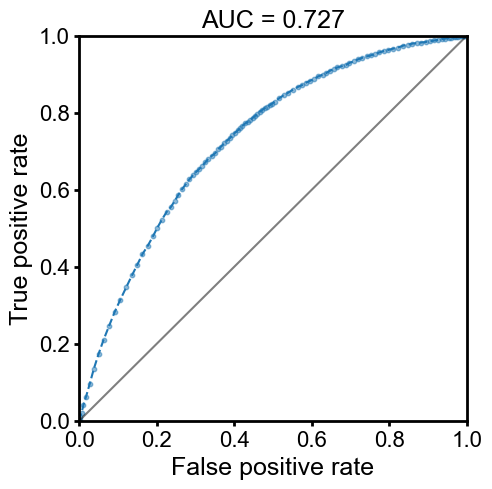

In [20]:
# plot ROC
from sklearn.metrics import auc

# pos_thress = [0.85,0.825,0.8,0.775,0.75,0.725,0.7,0.65,0.6,0.55,0.5,0.45,0.4,0.35,0.3,0.2,0.1,0]
# diff_thress = [0.25,0.225,0.2,0.175,0.15,0.125,0.1,0.05,0,-0.05,-0.1,-0.2,-0.3]

imped = 0.8

pos_thress = np.linspace(0.9,0.6,61).tolist()+ np.linspace(0.59,0.1,50).tolist()
diff_thress = (np.linspace(0.4,0.1,61)*imped).tolist() + (np.linspace(0.09,-0.4,50)*imped).tolist()
# diff_thress = [-1]
# pos_thress = [0]

tprs = []
fprs = []
thress = []

reps = 1400
test_data_use = test_data[:reps,:,:]

timestamp = datetime.datetime.now().strftime("%Y_%m_%d_%H_%M_%S")

for pos_thres,diff_thres in zip(pos_thress,diff_thress):
    positive_stats = np.full(test_data_use.shape[:2], False, dtype=bool)
    for i in range(test_data_use.shape[0]):
        for j in range(test_data_use.shape[1]):
            if (test_data_use[i,j,0]>pos_thres) & (test_data_use[i,j,0]-test_data_use[i,j,1]>diff_thres):
                positive_stats[i,j] = True

    positives = np.sum(positive_stats,axis = 0)/reps
    tpr = np.mean(positives[:4])
    fpr = np.mean(positives[4:])
    tprs.append(tpr)
    fprs.append(fpr)
    thress.append((pos_thres,diff_thres))

fprs, tprs, thress = zip(*sorted(zip(fprs, tprs, thress)))

fig = plt.figure(figsize = (5,5))
plt.plot(fprs,tprs,linestyle = '--')
plt.scatter(fprs,tprs,s = 10,alpha = 0.5)
plt.xlim((0,1))
plt.ylim((0,1))
plt.plot([0,1],[0,1],color = 'black',alpha = 0.5)
plt.title(f'AUC = {auc(fprs,tprs):.3f}')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()


with open(f'../plots/Fig_S13B_data.txt','w') as datfile:
    datfile.write('Threshold 1\t'+'\t'.join([str(tpr[0]) for tpr in thress])+'\n')
    datfile.write('Threshold 2\t'+'\t'.join([str(tpr[1]) for tpr in thress])+'\n')
    datfile.write('False Positive Rate\t'+'\t'.join([str(tpr) for tpr in fprs])+'\n')
    datfile.write('True Positive Rate\t'+'\t'.join([str(tpr) for tpr in tprs])+'\n')
    

# with PdfPages(f'../plots/Fig_S12C_centrality_ROC.pdf') as pdf:
#     pdf.savefig(fig,bbox_inches ='tight')

## Miscellaneous

In [21]:
np.argmax(np.array(tprs)/(np.array(tprs)+np.array(fprs)))

/tmp/ipykernel_199917/2292610351.py:1: RuntimeWarning: invalid value encountered in divide
  np.argmax(np.array(tprs)/(np.array(tprs)+np.array(fprs)))


0

In [22]:
np.argmax(np.array(tprs)-np.array(fprs))

35

In [23]:
np.max(np.array(tprs)/(np.array(tprs)+np.array(fprs)))

/tmp/ipykernel_199917/1729635349.py:1: RuntimeWarning: invalid value encountered in divide
  np.max(np.array(tprs)/(np.array(tprs)+np.array(fprs)))


nan

/tmp/ipykernel_199917/589913497.py:1: RuntimeWarning: invalid value encountered in divide
  plt.plot(np.array(tprs)/(np.array(tprs)+np.array(fprs)))


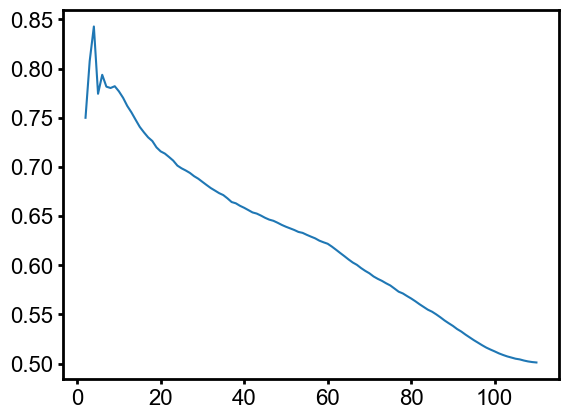

In [24]:
plt.plot(np.array(tprs)/(np.array(tprs)+np.array(fprs)))
plt.show()

In [25]:
ind = 35
thress[ind],(np.array(tprs)/(np.array(tprs)+np.array(fprs)))[ind], tprs[ind], 1-fprs[ind]

/tmp/ipykernel_199917/1055042466.py:2: RuntimeWarning: invalid value encountered in divide
  thress[ind],(np.array(tprs)/(np.array(tprs)+np.array(fprs)))[ind], tprs[ind], 1-fprs[ind]


((0.725, 0.18), 0.6713866039952998, 0.6801785714285715, 0.6670833333333335)

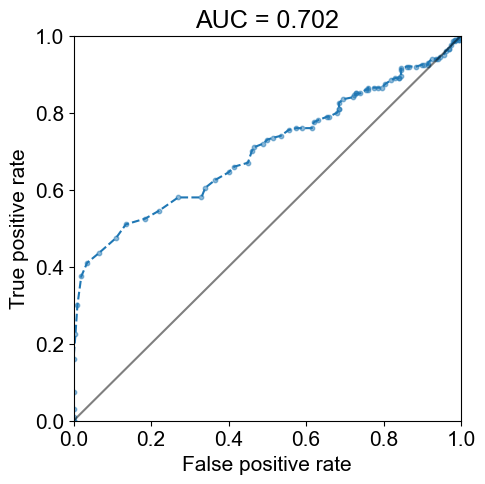

In [ ]:
## test on real dataset ("artificial" populations generated by mixing published ancient pedigrees)

TF_lst = np.load('../result_csvs/TF_lst_realdata_test.npy')
top_meds = np.load('../result_csvs/top_meds_mix_realdata_test_restrict_mean.npy')

imped = 0.8

pos_thress = np.linspace(0.9,0.6,61).tolist()+ np.linspace(0.59,0.1,50).tolist()
diff_thress = (np.linspace(0.4,0.1,61)*imped).tolist() + (np.linspace(0.09,-0.4,50)*imped).tolist()

tprs = []
fprs = []
thress = []


for pos_thres,diff_thres in zip(pos_thress,diff_thress):
    stats = [0,0,0,0]
    for j in range(len(TF_lst)):
        if (top_meds[0,j]>pos_thres) & ((top_meds[0,j]-top_meds[1,j])>diff_thres):
            if TF_lst[j]==1:
                stats[0]+=1 #TP
            else:
                stats[1]+=1 #FP
        else:
            if TF_lst[j]==1:
                stats[3]+=1 #FN
            else:
                stats[2]+=1 #TN 
    
    TP,FP,TN,FN = stats
    tpr = TP/(TP+FN)
    fpr = FP/(FP+TN)
    tprs.append(tpr)
    fprs.append(fpr)
    thress.append((pos_thres,diff_thres))

fprs, tprs, thress = zip(*sorted(zip(fprs, tprs, thress)))

fig = plt.figure(figsize = (5,5))
plt.plot(fprs,tprs,linestyle = '--')
plt.scatter(fprs,tprs,s = 10,alpha = 0.5)
plt.xlim((0,1))
plt.ylim((0,1))
plt.plot([0,1],[0,1],color = 'black',alpha = 0.5)
plt.title(f'AUC = {auc(fprs,tprs):.3f}')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()

# with PdfPages(f'../plots/Centrality_AUC_mix_0418.pdf') as pdf:
#     pdf.savefig(fig,bbox_inches ='tight')